# Imports

In [1]:
from cryomethods_comparison_pipeline.distribution_to_distribution import sort_by_transport
from dataclasses import dataclass
from dataclasses_json import dataclass_json
from typing import List
import yaml
import pickle
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt


2024-06-17 10:48:31.915257: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-06-17 10:48:32.469093: I tensorflow/core/util/port.cc:104] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-06-17 10:48:45.662732: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, re

# FSC distance (map to map)

In [2]:
@dataclass_json
@dataclass
class PlottingConfig:
    map2map_results: List[str]
    gt_metadata: str

with open("../config_files/config_plotting.yaml", "r") as file:
    config = yaml.safe_load(file)
config = PlottingConfig.from_dict(config)


In [28]:
def get_fsc_distances(fnames, map2map_distance):
    data_d = {}
    for idx, fname in enumerate(fnames):
        if fname not in data_d.keys():
            with open(fname, 'rb') as f:
                data = pickle.load(f)
                anonymous_label = data[map2map_distance]['user_submission_label']
                data_d[anonymous_label] = data
        else:
            data = data_d[fname]
    return data_d
data_d = get_fsc_distances(config.map2map_results, 'fsc')

In [7]:
metadata_df = pd.read_csv(config.gt_metadata)
metadata_df.sort_values('pc1', inplace=True)
gt_ordering = metadata_df.index.tolist()

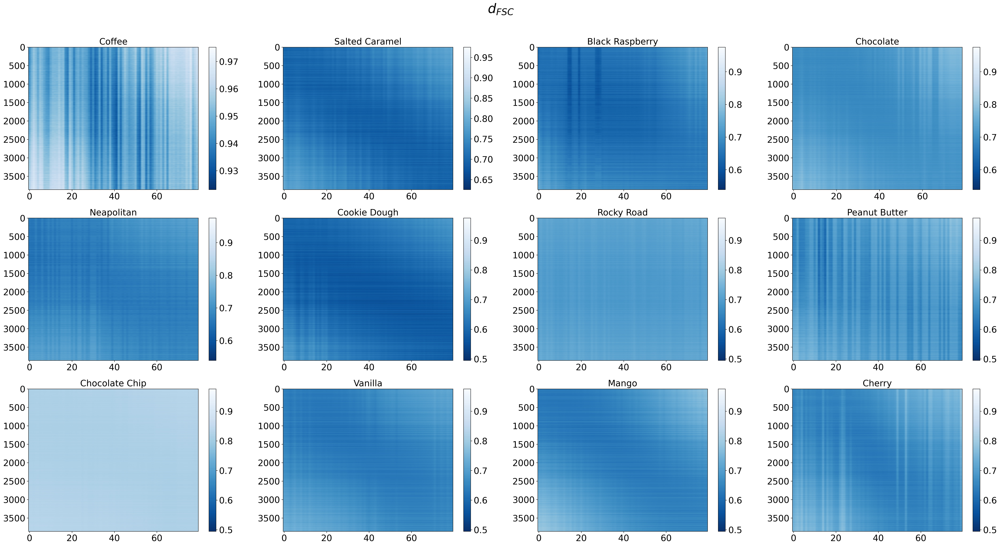

In [29]:
def plot_fsc_distances(data_d, gt_ordering):

    smaller_fontsize = 20
    larger_fontsize = 30
    n_plts = 12
    vmin, vmax = np.inf, -np.inf

    fig, axis = plt.subplots(3,n_plts//3,
                            figsize=(40,20),
                            dpi=300,
                            )
    fig.suptitle(r'$d_{FSC}$', y=0.95, fontsize=larger_fontsize)

    for idx, (anonymous_label, data) in enumerate(data_d.items()):
        map2map_dist_matrix = data['fsc']['cost_matrix'].iloc[gt_ordering].values
        sorted_map2map_dist_matrix, indices, transport = sort_by_transport(map2map_dist_matrix)


        ncols = 4
        if map2map_dist_matrix.min() < vmin:
            vmin = map2map_dist_matrix.min()
        if map2map_dist_matrix.max() > vmax:
            vmax = map2map_dist_matrix.max()

        ax = axis[idx//ncols,idx%ncols].imshow(sorted_map2map_dist_matrix, aspect='auto', cmap='Blues_r', vmin=vmin, vmax=vmax)


        axis[idx//ncols,idx%ncols].tick_params(axis='both', labelsize=smaller_fontsize)
        cbar = fig.colorbar(ax)
        cbar.ax.tick_params(labelsize=smaller_fontsize)
        plot_panel_label = anonymous_label
        axis[idx//ncols,idx%ncols].set_title(plot_panel_label, fontsize=smaller_fontsize)

plot_fsc_distances(data_d, gt_ordering)